#MIRNetv2

*   ref code: https://www.kaggle.com/code/soumikrakshit/low-light-image-enhancement-using-mirnetv2
*   original code (มี task เพิ่มความคมชัด,contrast,ลดnoising) : https://colab.research.google.com/drive/1HN9Sd8UEqB1k_O8RpdRLL8ZUKcxh5LP8






# ติดตั้ง Library

In [ ]:
# เช็คเวอรืชั่น tensorflow-addons= กับ transformers กับ python ได้ที่ https://www.tensorflow.org/install/source#gpu
!pip install tensorflow-addons==0.22.0
!pip install TensorFlow==2.14.0
!pip install git+https://github.com/wandb/wandb.git
!yes | apt install --allow-change-held-packages libcudnn=8.7.0-1+cuda11.8
# !apt-get install libcudnn8=8.1.1.33-1+cuda11.2.0.1 --allow-downgrades
import random
import numpy as np
from glob import glob
from functools import partial
from PIL import Image, ImageOps

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

import tensorflow as tf
import tensorflow_addons as tfa
from transformers.tf_utils import shape_list

import wandb
from wandb.keras import WandbMetricsLogger, WandbModelCheckpoint


AUTOTUNE = tf.data.AUTOTUNE

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.3/612.3 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 489.8/489.8 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 50.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 40.3 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.15.0
    Uninstalling tensorflow-estimator-2.15.0:
      Successfully uninstalled tensorflow-estimator-2.15.0
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
  Attempting uninstall: google-auth-oauthlib
    Found existing installation: google-auth-oauthlib 1.2.0
    Uninstalling google-auth-oauthlib-1.2.0:
      Successfully uninstalled google-auth-oauthlib-1.2.0
  Attempting uninstall: t

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
!pip show tensorflow

Name: tensorflow
Version: 2.14.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, ml-dtypes, numpy, opt-einsum, packaging, protobuf, setuptools, six, tensorboard, tensorflow-estimator, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: dopamine-rl


In [ ]:
!pip show tensorflow_addons

Name: tensorflow-addons
Version: 0.22.0
Summary: TensorFlow Addons.
Home-page: UNKNOWN
Author: Google Inc.
Author-email: opensource@google.com
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: packaging, typeguard
Required-by: 


In [ ]:
import os
from getpass import getpass
#ใส่ wandb_api_key ของตัวเอง (You can find your API key in your browser here: https://wandb.ai/authorize)
api_key = getpass('Enter your wandb API key:')
os.environ["WANDB_API_KEY"] = api_key
wandb.login()

Enter your wandb API key:··········


wandb: Currently logged in as: kontorn9944 (konthorn). Use `wandb login --relogin` to force relogin


True

#Setting up a Weights & Biases run
<hr />



**wandb.init() **เป็นฟังก์ชันที่ใช้เพื่อเริ่มต้นการทำงานกับ Weights & Biases (W&B) ในโปรเจ็กต์

*   project: ชื่อของโปรเจ็กต์
*   entity: ชื่อผู้ใช้ (username) หรือทีม (team name)


In [ ]:
# ตรวจสอบ TensorFlow เวอร์ชัน
print(f"TensorFlow version: {tf.__version__}")

TensorFlow version: 2.14.0


##ตรวจสอบ GPU

In [ ]:
# การตรวจสอบ GPU
gpus = tf.config.list_physical_devices('GPU')
if not gpus:
    print('No GPUs found. Using CPU instead.')
    strategy = tf.distribute.get_strategy()  # Default to default strategy that works on CPU and single GPU
else:
    print('GPUs found. Using GPU.')
    strategy = tf.distribute.MirroredStrategy()

# กำหนดค่าพารามิเตอร์ WandB
config_defaults = {
    'seed': 42,
    'num_gpus': len(tf.config.list_physical_devices('GPU')),
    'dataset_artifact_address': 'ml-colabs/mirnet-v2/lol-dataset:v0',
    'image_size': 128,
    'max_train_images': 400,
    'batch_size': 4,
    'channels': 80,
    'channel_factor': 1.5,
    'num_mrb_blocks': 2,
    'add_residual_connection': True,
    'initial_learning_rate': 2e-4,
    'minimum_learning_rate': 1e-6,
    'epochs': 100,
}

# เริ่มการทำงาน WandB และใช้ config_defaults
wandb.init(project="mirnet-v2", entity="konthorn", config=config_defaults)
config = wandb.config

#ตั้งค่าขนาด batch_size ตามจำนวน replicas
batch_size = config.batch_size * strategy.num_replicas_in_sync

GPUs found. Using GPU.


In [ ]:
run = wandb.init(project="mirnet-v2", entity="konthorn")

#LOL Dataset<hr />
This dataset provides 485 images for training and 15 for testing.

ที่มา dataset: https://www.kaggle.com/datasets/soumikrakshit/lol-dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# เปลี่ยน path เป็นตำแหน่งที่เก็บข้อมูลที่แน่นอนบน Google Drive
dataset_dir = "/content/drive/My Drive/dataset444/lol_dataset"


TRAIN_LOW_LIGHT_IMAGES = sorted(
    glob(os.path.join(dataset_dir, "our485/low/*"))
)[:config.max_train_images]
TRAIN_GROUND_TRUTH_IMAGES = sorted(
    glob(os.path.join(dataset_dir, "our485/high/*"))
)[:config.max_train_images]

VAL_LOW_LIGHT_IMAGES = sorted(
    glob(os.path.join(dataset_dir, "our485/low/*"))
)[config.max_train_images:]
VAL_GROUND_TRUTH_IMAGES = sorted(
    glob(os.path.join(dataset_dir, "our485/high/*"))
)[config.max_train_images:]

TEST_LOW_LIGHT_IMAGES = sorted(
    glob(os.path.join(dataset_dir, "eval15/low/*"))
)
TEST_GROUND_TRUTH_IMAGES = sorted(
    glob(os.path.join(dataset_dir, "eval15/high/*"))
)

# คำสั่ง print ถูกใช้เพื่อแสดงขนาดของชุดข้อมูลที่จะใช้
print(f"Train Dataset: ({len(TRAIN_LOW_LIGHT_IMAGES)}, {len(TRAIN_GROUND_TRUTH_IMAGES)})")
print(f"Validation Dataset: ({len(VAL_LOW_LIGHT_IMAGES)}, {len(VAL_GROUND_TRUTH_IMAGES)})")
print(f"Test Dataset: ({len(TEST_LOW_LIGHT_IMAGES)}, {len(TEST_GROUND_TRUTH_IMAGES)})")


Train Dataset: (400, 400)
Validation Dataset: (85, 85)
Test Dataset: (15, 15)


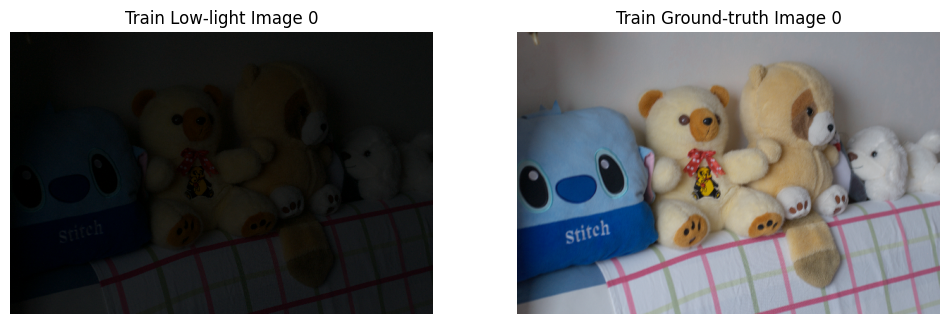

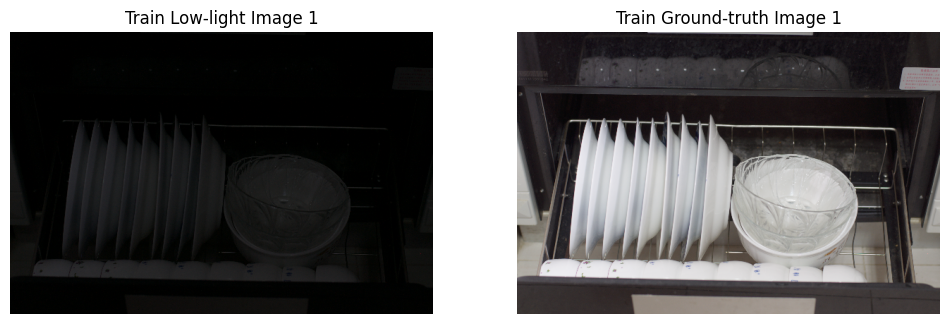

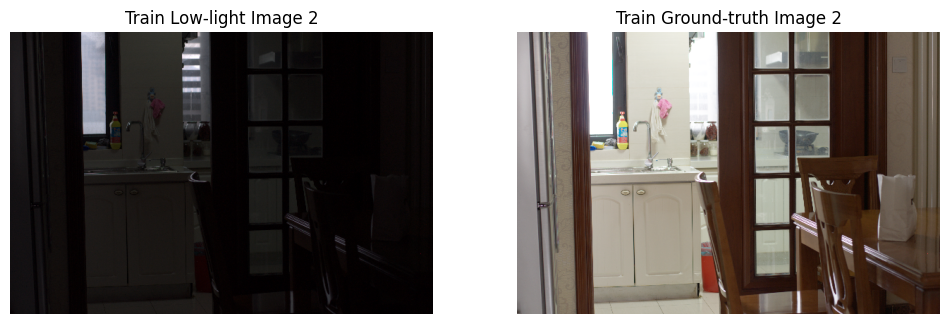

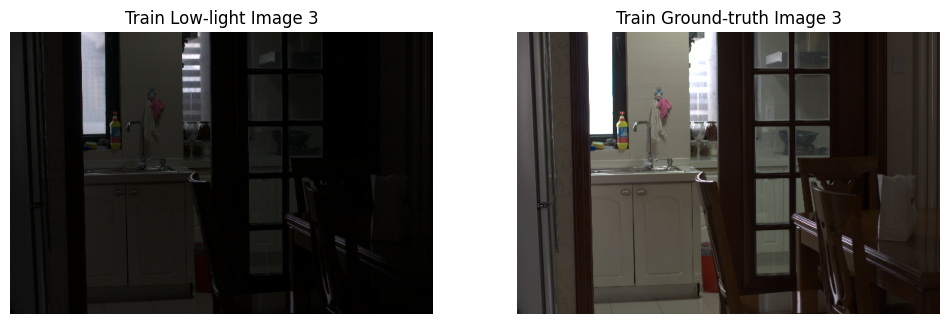

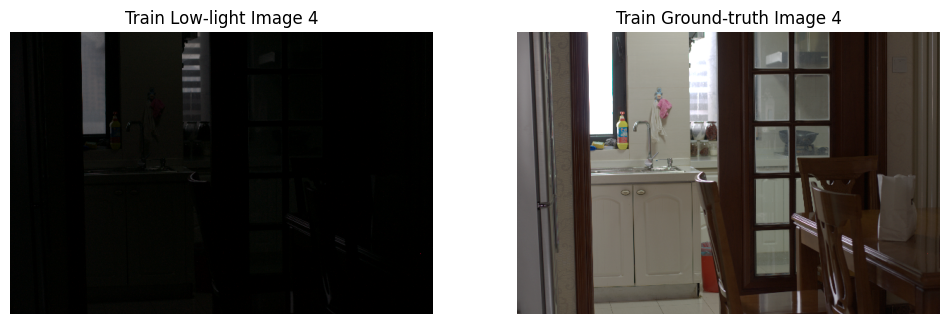

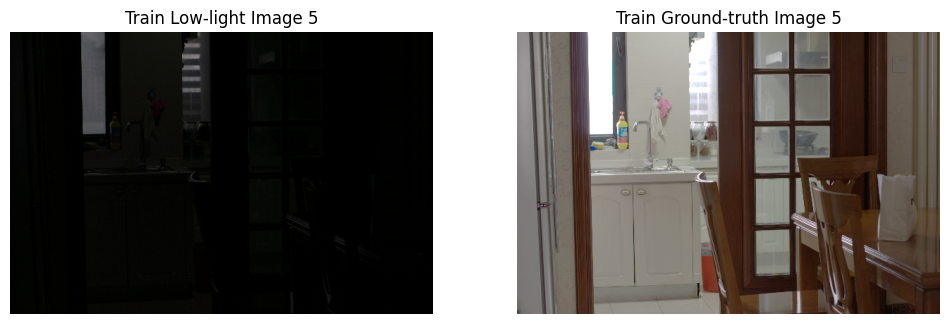

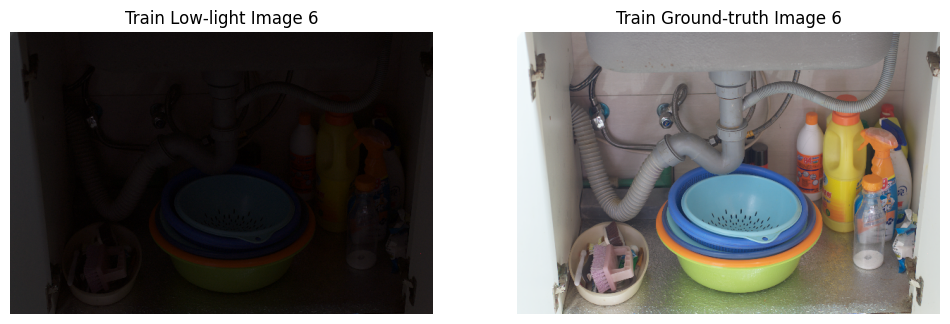

In [ ]:
def plot_results(images, titles, figure_size=(12, 12)):
    """A simple utility for plotting the results"""
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i + 1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
    plt.show()


for idx, (low_light_image, ground_truth_image) in enumerate(zip(TRAIN_LOW_LIGHT_IMAGES[:7], TRAIN_GROUND_TRUTH_IMAGES[:7])):
    plot_results(
        [Image.open(low_light_image), Image.open(ground_truth_image)],
        [f"Train Low-light Image {idx}", f"Train Ground-truth Image {idx}"]
    )


##จัดเตรียมภาพใน  Data set ให้พร้อมใช้งาน

In [ ]:
def read_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.cast(image, dtype=tf.float32) / 255.0
    return image


def random_crop(low_image, gt_image):
    low_image_shape = tf.shape(low_image)[:2]
    crop_width = tf.random.uniform(
        shape=(), maxval=low_image_shape[1] - config.image_size + 1, dtype=tf.int32
    )
    crop_height = tf.random.uniform(
        shape=(), maxval=low_image_shape[0] - config.image_size + 1, dtype=tf.int32
    )
    low_image_cropped = low_image[
        crop_height : crop_height + config.image_size,
        crop_width : crop_width + config.image_size
    ]
    gt_image_cropped = gt_image[
        crop_height : crop_height + config.image_size,
        crop_width : crop_width + config.image_size
    ]
    low_image_cropped.set_shape([config.image_size, config.image_size, 3])
    gt_image_cropped.set_shape([config.image_size, config.image_size, 3])
    return low_image_cropped, gt_image_cropped


def resize_images(low_image, gt_image):
    low_image = tf.image.resize(low_image, size=[config.image_size, config.image_size])
    gt_image = tf.image.resize(gt_image, size=[config.image_size, config.image_size])
    low_image.set_shape([config.image_size, config.image_size, 3])
    gt_image.set_shape([config.image_size, config.image_size, 3])
    return low_image, gt_image


def load_data(low_light_image_path, enhanced_image_path, apply_resize):
    low_light_image = read_image(low_light_image_path)
    enhanced_image = read_image(enhanced_image_path)
    low_light_image, enhanced_image = (
        resize_images(low_light_image, enhanced_image) if apply_resize
        else random_crop(low_light_image, enhanced_image)
    )
    return low_light_image, enhanced_image


def get_dataset(low_light_images, enhanced_images, apply_resize):
    dataset = tf.data.Dataset.from_tensor_slices((low_light_images, enhanced_images))
    dataset = dataset.map(
        partial(load_data, apply_resize=apply_resize),
        num_parallel_calls=AUTOTUNE
    )
    dataset = dataset.batch(config.batch_size, drop_remainder=True)
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

In [ ]:
train_dataset = get_dataset(TRAIN_LOW_LIGHT_IMAGES, TRAIN_GROUND_TRUTH_IMAGES, apply_resize=False)
val_dataset = get_dataset(VAL_LOW_LIGHT_IMAGES, VAL_GROUND_TRUTH_IMAGES, apply_resize=True)

print("Train Dataset:", train_dataset.element_spec)
print("Validation Dataset:", val_dataset.element_spec)

Train Dataset: (TensorSpec(shape=(4, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 128, 128, 3), dtype=tf.float32, name=None))
Validation Dataset: (TensorSpec(shape=(4, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 128, 128, 3), dtype=tf.float32, name=None))


#โครงสร้าง MIRNetv2

In [ ]:
#Selective Kernel Feature Fusion
class SelectiveKernelFeatureFusion(tf.keras.layers.Layer):
    def __init__(self, channels: int, *args, **kwargs) -> None:
        super().__init__(*args, **kwargs)

        self.hidden_channels = max(int(channels / 8), 4)

        self.average_pooling = tfa.layers.AdaptiveAveragePooling2D(output_size=1)

        self.conv_channel_downscale = tf.keras.layers.Conv2D(
            self.hidden_channels, kernel_size=1, padding="same"
        )
        self.conv_attention_1 = tf.keras.layers.Conv2D(
            channels, kernel_size=1, strides=1, padding="same"
        )
        self.conv_attention_2 = tf.keras.layers.Conv2D(
            channels, kernel_size=1, strides=1, padding="same"
        )

        self.leaky_relu = tf.keras.layers.LeakyReLU(alpha=0.2)
        self.sorftmax = tf.keras.layers.Softmax(axis=-1)

    def call(self, inputs, *args, **kwargs):
        combined_input_features = inputs[0] + inputs[1]
        channel_wise_statistics = self.average_pooling(combined_input_features)
        downscaled_channel_wise_statistics = self.conv_channel_downscale(
            channel_wise_statistics
        )
        attention_vector_1 = self.sorftmax(
            self.conv_attention_1(downscaled_channel_wise_statistics)
        )
        attention_vector_2 = self.sorftmax(
            self.conv_attention_2(downscaled_channel_wise_statistics)
        )
        selected_features = (
            inputs[0] * attention_vector_1 + inputs[1] * attention_vector_2
        )
        return selected_features

In [ ]:
#Residual Contextual Block
class ContextBlock(tf.keras.layers.Layer):
    def __init__(self, channels: int, *args, **kwargs):
        super().__init__(*args, **kwargs)

        self.mask_conv = tf.keras.layers.Conv2D(
            1, kernel_size=1, padding="same"
        )

        self.channel_add_conv_1 = tf.keras.layers.Conv2D(
            channels, kernel_size=1, padding="same"
        )
        self.channel_add_conv_2 = tf.keras.layers.Conv2D(
            channels, kernel_size=1, padding="same"
        )

        self.softmax = tf.keras.layers.Softmax(axis=1)
        self.leaky_relu = tf.keras.layers.LeakyReLU(alpha=0.2)

    def modeling(self, inputs):
        _, height, width, channels = shape_list(inputs)
        reshaped_inputs = tf.expand_dims(
            tf.reshape(inputs, (-1, channels, height * width)), axis=1
        )

        context_mask = self.mask_conv(inputs)
        context_mask = tf.reshape(context_mask, (-1, height * width, 1))
        context_mask = self.softmax(context_mask)
        context_mask = tf.expand_dims(context_mask, axis=1)

        context = tf.reshape(
            tf.matmul(reshaped_inputs, context_mask), (-1, 1, 1, channels)
        )
        return context

    def call(self, inputs, *args, **kwargs):
        context = self.modeling(inputs)
        channel_add_term = self.channel_add_conv_1(context)
        channel_add_term = self.leaky_relu(channel_add_term)
        channel_add_term = self.channel_add_conv_2(channel_add_term)
        return inputs + channel_add_term


class ResidualContextBlock(tf.keras.layers.Layer):
    def __init__(self, channels: int, groups: int, *args, **kwargs):
        super().__init__(*args, **kwargs)

        self.conv_1 = tf.keras.layers.Conv2D(
            channels, kernel_size=3, padding="same", groups=groups
        )
        self.conv_2 = tf.keras.layers.Conv2D(
            channels, kernel_size=3, padding="same", groups=groups
        )
        self.leaky_relu = tf.keras.layers.LeakyReLU(alpha=0.2)

        self.context_block = ContextBlock(channels=channels)

    def call(self, inputs):
        x = self.conv_1(inputs)
        x = self.leaky_relu(x)
        x = self.conv_2(x)
        x = self.context_block(x)
        x = self.leaky_relu(x)
        x = x + inputs
        return x

In [ ]:
#Multi-Scale Residual Block
class DownBlock(tf.keras.layers.Layer):
    def __init__(
        self, channels: int, channel_factor: float, *args, **kwargs
    ):
        super(DownBlock, self).__init__(*args, **kwargs)
        self.average_pool = tf.keras.layers.AveragePooling2D(
            pool_size=2, strides=2
        )
        self.conv = tf.keras.layers.Conv2D(
            int(channels * channel_factor),
            kernel_size=1,
            strides=1,
            padding="same"
        )

    def call(self, inputs, *args, **kwargs):
        return self.conv(self.average_pool(inputs))


class DownSampleBlock(tf.keras.layers.Layer):
    def __init__(
        self,
        channels: int,
        scale_factor: int,
        channel_factor: float,
        *args,
        **kwargs
    ):
        super(DownSampleBlock, self).__init__(*args, **kwargs)
        self.layers = []
        for _ in range(int(np.log2(scale_factor))):
            self.layers.append(DownBlock(channels, channel_factor))
            channels = int(channels * channel_factor)

    def call(self, x, *args, **kwargs):
        for layer in self.layers:
            x = layer(x)
        return x

In [ ]:
class UpBlock(tf.keras.layers.Layer):
    def __init__(self, channels: int, channel_factor: float, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.conv = tf.keras.layers.Conv2D(
            int(channels // channel_factor), kernel_size=1, strides=1, padding="same"
        )
        self.upsample = tf.keras.layers.UpSampling2D(size=2, interpolation="bilinear")

    def call(self, inputs, *args, **kwargs):
        return self.upsample(self.conv(inputs))


class UpSampleBlock(tf.keras.layers.Layer):
    def __init__(
        self, channels: int, scale_factor: int, channel_factor: float, *args, **kwargs
    ):
        super().__init__(*args, **kwargs)
        self.layers = []
        for _ in range(int(np.log2(scale_factor))):
            self.layers.append(UpBlock(channels, channel_factor))
            channels = int(channels // channel_factor)

    def call(self, x, *args, **kwargs):
        for layer in self.layers:
            x = layer(x)
        return x

In [ ]:
class MultiScaleResidualBlock(tf.keras.layers.Layer):
    def __init__(
        self,
        channels: int,
        channel_factor: float,
        groups: int,
        *args,
        **kwargs
    ):
        super().__init__(*args, **kwargs)

        # Residual Context Blocks
        self.rcb_top = ResidualContextBlock(
            int(channels * channel_factor**0), groups=groups
        )
        self.rcb_middle = ResidualContextBlock(
            int(channels * channel_factor**1), groups=groups
        )
        self.rcb_bottom = ResidualContextBlock(
            int(channels * channel_factor**2), groups=groups
        )

        # Downsample Blocks
        self.down_2 = DownSampleBlock(
            channels=int((channel_factor**0) * channels),
            scale_factor=2,
            channel_factor=channel_factor,
        )
        self.down_4_1 = DownSampleBlock(
            channels=int((channel_factor ** 0) * channels),
            scale_factor=2,
            channel_factor=channel_factor,
        )
        self.down_4_2 = DownSampleBlock(
            channels=int((channel_factor ** 1) * channels),
            scale_factor=2,
            channel_factor=channel_factor,
        )

        # UpSample Blocks
        self.up21_1 = UpSampleBlock(
            channels=int((channel_factor ** 1) * channels),
            scale_factor=2,
            channel_factor=channel_factor,
        )
        self.up21_2 = UpSampleBlock(
            channels=int((channel_factor ** 1) * channels),
            scale_factor=2,
            channel_factor=channel_factor,
        )
        self.up32_1 = UpSampleBlock(
            channels=int((channel_factor ** 2) * channels),
            scale_factor=2,
            channel_factor=channel_factor,
        )
        self.up32_2 = UpSampleBlock(
            channels=int((channel_factor ** 2) * channels),
            scale_factor=2,
            channel_factor=channel_factor,
        )

        # SKFF Blocks
        self.skff_top = SelectiveKernelFeatureFusion(
            channels=int(channels * channel_factor**0)
        )
        self.skff_middle = SelectiveKernelFeatureFusion(
            channels=int(channels * channel_factor**1)
        )

        # Convolution
        self.conv_out = tf.keras.layers.Conv2D(
            channels, kernel_size=1, padding="same"
        )

    def call(self, inputs, *args, **kwargs):
        x_top = inputs
        x_middle = self.down_2(x_top)
        x_bottom = self.down_4_2(self.down_4_1(x_top))

        x_top = self.rcb_top(x_top)
        x_middle = self.rcb_middle(x_middle)
        x_bottom = self.rcb_bottom(x_bottom)

        x_middle = self.skff_middle([x_middle, self.up32_1(x_bottom)])
        x_top = self.skff_top([x_top, self.up21_1(x_middle)])

        x_top = self.rcb_top(x_top)
        x_middle = self.rcb_middle(x_middle)
        x_bottom = self.rcb_bottom(x_bottom)

        x_middle = self.skff_middle([x_middle, self.up32_2(x_bottom)])
        x_top = self.skff_top([x_top, self.up21_2(x_middle)])

        output = self.conv_out(x_top)
        output = output + inputs

        return output

In [ ]:
#Putting Everything Together in MIRNet-v2
class RecursiveResidualGroup(tf.keras.layers.Layer):
    def __init__(
        self,
        channels: int,
        num_mrb_blocks: int,
        channel_factor: float,
        groups: int,
        *args,
        **kwargs
    ):
        super().__init__(*args, **kwargs)
        self.layers = [
            MultiScaleResidualBlock(channels, channel_factor, groups)
            for _ in range(num_mrb_blocks)
        ]
        self.layers.append(
            tf.keras.layers.Conv2D(
                channels, kernel_size=3, strides=1, padding="same"
            )
        )

    def call(self, inputs, *args, **kwargs):
        residual = inputs
        for layer in self.layers:
            residual = layer(residual)
        residual = residual + inputs
        return residual


class MirNetv2(tf.keras.Model):
    def __init__(
        self,
        channels: int,
        channel_factor: float,
        num_mrb_blocks: int,
        add_residual_connection: bool,
        *args,
        **kwargs
    ):
        super().__init__(*args, **kwargs)

        self.add_residual_connection = add_residual_connection

        self.conv_in = tf.keras.layers.Conv2D(
            channels, kernel_size=3, padding="same"
        )

        self.rrg_block_1 = RecursiveResidualGroup(
            channels, num_mrb_blocks, channel_factor, groups=1
        )
        self.rrg_block_2 = RecursiveResidualGroup(
            channels, num_mrb_blocks, channel_factor, groups=2
        )
        self.rrg_block_3 = RecursiveResidualGroup(
            channels, num_mrb_blocks, channel_factor, groups=4
        )
        self.rrg_block_4 = RecursiveResidualGroup(
            channels, num_mrb_blocks, channel_factor, groups=4
        )

        self.conv_out = tf.keras.layers.Conv2D(
            3, kernel_size=3, padding="same"
        )

    def call(self, inputs, training=None, mask=None):
        shallow_features = self.conv_in(inputs)
        deep_features = self.rrg_block_1(shallow_features)
        deep_features = self.rrg_block_2(deep_features)
        deep_features = self.rrg_block_3(deep_features)
        deep_features = self.rrg_block_4(deep_features)
        output = self.conv_out(deep_features)
        output = output + inputs if self.add_residual_connection else output
        return output

##ประกาศ Loss และ Metric ที่ใช้วัดผล

In [ ]:
# class CharbonnierLoss(tf.keras.losses.Loss):
#     def __init__(self, epsilon: float, *args, **kwargs):
#         super().__init__(*args, **kwargs)
#         self.epsilon = tf.convert_to_tensor(epsilon)

#     def call(self, y_true, y_pred):
#         squared_difference = tf.square(y_true - y_pred)
#         return tf.reduce_mean(
#             tf.sqrt(squared_difference + tf.square(self.epsilon))
#         )

class CharbonnierLoss(tf.keras.losses.Loss):
    def __init__(self, epsilon: float, reduction=tf.keras.losses.Reduction.AUTO, *args, **kwargs):
        super().__init__(reduction=reduction, *args, **kwargs)
        self.epsilon = tf.convert_to_tensor(epsilon)

    def call(self, y_true, y_pred):
        squared_difference = tf.square(y_true - y_pred)
        return tf.reduce_mean(
            tf.sqrt(squared_difference + tf.square(self.epsilon))
        )

class PSNRMetric(tf.keras.metrics.Metric):
    def __init__(self, max_val: float, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.max_val = max_val
        self.psnr = tf.keras.metrics.Mean(name="psnr")

    def update_state(self, y_true, y_pred, *args, **kwargs):
        psnr = tf.image.psnr(y_true, y_pred, max_val=self.max_val)
        self.psnr.update_state(psnr, *args, **kwargs)

    def result(self):
        return self.psnr.result()

    def reset_state(self):
        self.psnr.reset_state()


class SSIMMetric(tf.keras.metrics.Metric):
    def __init__(self, max_val: float, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.max_val = max_val
        self.ssim = tf.keras.metrics.Mean(name="ssim")

    def update_state(self, y_true, y_pred, *args, **kwargs):
        ssim = tf.image.ssim(y_true, y_pred, max_val=self.max_val)
        self.ssim.update_state(ssim, *args, **kwargs)

    def result(self):
        return self.ssim.result()

    def reset_state(self):
        self.ssim.reset_state()

## optimizer model

In [ ]:
with strategy.scope():
    model = MirNetv2(
        channels=config.channels,
        channel_factor=config.channel_factor,
        num_mrb_blocks=config.num_mrb_blocks,
        add_residual_connection=config.add_residual_connection
    )

    dummy_inputs = tf.ones((1, config.image_size, config.image_size, 3))
    dummy_outputs = model(dummy_inputs)
    model.summary(expand_nested=True)
    print("\nInput Shape:", dummy_inputs.shape)
    print("Output Shape:", dummy_outputs.shape)

    loss = CharbonnierLoss(epsilon=1e-3)

    psnr_metric = PSNRMetric(max_val=1.0)
    ssim_metric = SSIMMetric(max_val=1.0)

    decay_steps = (config.max_train_images // config.batch_size) * config.epochs
    lr_schedule_fn = tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=config.initial_learning_rate,
        decay_steps=decay_steps,
        alpha=config.minimum_learning_rate,
    )
    optimizer = tf.keras.optimizers.Adam(
        learning_rate=lr_schedule_fn, beta_1=0.9, beta_2=0.999,
    )

    model.compile(
        optimizer=optimizer, loss=loss, metrics=[psnr_metric, ssim_metric]
    )

Model: "mir_netv2_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_238 (Conv2D)         multiple                  2240      
                                                                 
 recursive_residual_group_4  multiple                  2426936   
  (RecursiveResidualGroup)                                       
|¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯|
| multi_scale_residual_bloc  multiple                  1184628  |
| k_8 (MultiScaleResidualBl                                     |
| ock)                                                          |
|                                                               |
| multi_scale_residual_bloc  multiple                  1184628  |
| k_9 (MultiScaleResidualBl                                     |
| ock)                                                          |
|                                                      

## เทรนโมเดล + เก็บ checkpoint ไว้ใน artifact ของ wandb + แสดงผลลัพธ์จากการเทรนโมเดล

In [ ]:
%%wandb

callbacks = [
    WandbMetricsLogger(),
    WandbModelCheckpoint(filepath="model", save_best_only=False)
]
# สร้าง Artifact
artifact = wandb.Artifact("model", type="model")

# บันทึกโมเดลในรูปแบบ SavedModel
model.save("model", save_format="tf")

# เพิ่มไดเรกทอรีที่มีโมเดลไปยัง Artifact
artifact.add_dir("model")

# บันทึก Artifact
run.log_artifact(artifact)



model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=config.epochs,
    callbacks=callbacks
)

wandb: Adding directory to artifact (./model)... Done. 0.1s


Epoch 1/100
100/100 [==============================] - ETA: 0s - loss: 0.1846 - psnr_metric_1: 14.7254 - ssim_metric_1: 0.6377

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 315s 2s/step - loss: 0.1846 - psnr_metric_1: 14.7254 - ssim_metric_1: 0.6377 - val_loss: 0.1704 - val_psnr_metric_1: 14.9492 - val_ssim_metric_1: 0.6777
Epoch 2/100
100/100 [==============================] - ETA: 0s - loss: 0.1518 - psnr_metric_1: 16.2141 - ssim_metric_1: 0.6823

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 135s 1s/step - loss: 0.1518 - psnr_metric_1: 16.2141 - ssim_metric_1: 0.6823 - val_loss: 0.1367 - val_psnr_metric_1: 16.1993 - val_ssim_metric_1: 0.7354
Epoch 3/100
100/100 [==============================] - ETA: 0s - loss: 0.1580 - psnr_metric_1: 15.8988 - ssim_metric_1: 0.6793

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 135s 1s/step - loss: 0.1580 - psnr_metric_1: 15.8988 - ssim_metric_1: 0.6793 - val_loss: 0.1287 - val_psnr_metric_1: 17.1232 - val_ssim_metric_1: 0.7472
Epoch 4/100
100/100 [==============================] - ETA: 0s - loss: 0.1610 - psnr_metric_1: 15.8150 - ssim_metric_1: 0.6656

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 139s 1s/step - loss: 0.1610 - psnr_metric_1: 15.8150 - ssim_metric_1: 0.6656 - val_loss: 0.1359 - val_psnr_metric_1: 16.7148 - val_ssim_metric_1: 0.7516
Epoch 5/100
100/100 [==============================] - ETA: 0s - loss: 0.1564 - psnr_metric_1: 16.3191 - ssim_metric_1: 0.6822

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 137s 1s/step - loss: 0.1564 - psnr_metric_1: 16.3191 - ssim_metric_1: 0.6822 - val_loss: 0.1386 - val_psnr_metric_1: 16.7837 - val_ssim_metric_1: 0.7614
Epoch 6/100
100/100 [==============================] - ETA: 0s - loss: 0.1539 - psnr_metric_1: 16.0291 - ssim_metric_1: 0.6769

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 137s 1s/step - loss: 0.1539 - psnr_metric_1: 16.0291 - ssim_metric_1: 0.6769 - val_loss: 0.1299 - val_psnr_metric_1: 17.0755 - val_ssim_metric_1: 0.7566
Epoch 7/100
100/100 [==============================] - ETA: 0s - loss: 0.1495 - psnr_metric_1: 16.5685 - ssim_metric_1: 0.6906

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 138s 1s/step - loss: 0.1495 - psnr_metric_1: 16.5685 - ssim_metric_1: 0.6906 - val_loss: 0.1228 - val_psnr_metric_1: 17.6045 - val_ssim_metric_1: 0.7669
Epoch 8/100
100/100 [==============================] - ETA: 0s - loss: 0.1465 - psnr_metric_1: 16.6216 - ssim_metric_1: 0.6969

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 138s 1s/step - loss: 0.1465 - psnr_metric_1: 16.6216 - ssim_metric_1: 0.6969 - val_loss: 0.1422 - val_psnr_metric_1: 16.6239 - val_ssim_metric_1: 0.7633
Epoch 9/100
100/100 [==============================] - ETA: 0s - loss: 0.1460 - psnr_metric_1: 16.6908 - ssim_metric_1: 0.7079

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 137s 1s/step - loss: 0.1460 - psnr_metric_1: 16.6908 - ssim_metric_1: 0.7079 - val_loss: 0.1472 - val_psnr_metric_1: 16.3024 - val_ssim_metric_1: 0.7601
Epoch 10/100
100/100 [==============================] - ETA: 0s - loss: 0.1374 - psnr_metric_1: 17.3068 - ssim_metric_1: 0.7122

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 135s 1s/step - loss: 0.1374 - psnr_metric_1: 17.3068 - ssim_metric_1: 0.7122 - val_loss: 0.1265 - val_psnr_metric_1: 17.6450 - val_ssim_metric_1: 0.7686
Epoch 11/100
100/100 [==============================] - ETA: 0s - loss: 0.1475 - psnr_metric_1: 16.7602 - ssim_metric_1: 0.7023

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 136s 1s/step - loss: 0.1475 - psnr_metric_1: 16.7602 - ssim_metric_1: 0.7023 - val_loss: 0.1367 - val_psnr_metric_1: 17.0076 - val_ssim_metric_1: 0.7635
Epoch 12/100
100/100 [==============================] - ETA: 0s - loss: 0.1438 - psnr_metric_1: 16.8563 - ssim_metric_1: 0.7048

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 138s 1s/step - loss: 0.1438 - psnr_metric_1: 16.8563 - ssim_metric_1: 0.7048 - val_loss: 0.1425 - val_psnr_metric_1: 16.7230 - val_ssim_metric_1: 0.7687
Epoch 13/100
100/100 [==============================] - ETA: 0s - loss: 0.1313 - psnr_metric_1: 17.7382 - ssim_metric_1: 0.7176

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 138s 1s/step - loss: 0.1313 - psnr_metric_1: 17.7382 - ssim_metric_1: 0.7176 - val_loss: 0.1414 - val_psnr_metric_1: 16.8152 - val_ssim_metric_1: 0.7686
Epoch 14/100
100/100 [==============================] - ETA: 0s - loss: 0.1291 - psnr_metric_1: 17.9884 - ssim_metric_1: 0.7223

wandb: Adding directory to artifact (./model)... Done. 2.4s


100/100 [==============================] - 136s 1s/step - loss: 0.1291 - psnr_metric_1: 17.9884 - ssim_metric_1: 0.7223 - val_loss: 0.1440 - val_psnr_metric_1: 16.7018 - val_ssim_metric_1: 0.7668
Epoch 15/100
100/100 [==============================] - ETA: 0s - loss: 0.1275 - psnr_metric_1: 18.0428 - ssim_metric_1: 0.7264

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 139s 1s/step - loss: 0.1275 - psnr_metric_1: 18.0428 - ssim_metric_1: 0.7264 - val_loss: 0.1372 - val_psnr_metric_1: 17.0979 - val_ssim_metric_1: 0.7715
Epoch 16/100
100/100 [==============================] - ETA: 0s - loss: 0.1280 - psnr_metric_1: 17.8434 - ssim_metric_1: 0.7226

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 140s 1s/step - loss: 0.1280 - psnr_metric_1: 17.8434 - ssim_metric_1: 0.7226 - val_loss: 0.1457 - val_psnr_metric_1: 16.6124 - val_ssim_metric_1: 0.7683
Epoch 17/100
100/100 [==============================] - ETA: 0s - loss: 0.1269 - psnr_metric_1: 18.1911 - ssim_metric_1: 0.7309

wandb: Adding directory to artifact (./model)... Done. 1.0s


100/100 [==============================] - 136s 1s/step - loss: 0.1269 - psnr_metric_1: 18.1911 - ssim_metric_1: 0.7309 - val_loss: 0.1422 - val_psnr_metric_1: 16.7731 - val_ssim_metric_1: 0.7714
Epoch 18/100
100/100 [==============================] - ETA: 0s - loss: 0.1215 - psnr_metric_1: 18.5260 - ssim_metric_1: 0.7303

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 136s 1s/step - loss: 0.1215 - psnr_metric_1: 18.5260 - ssim_metric_1: 0.7303 - val_loss: 0.1466 - val_psnr_metric_1: 16.5757 - val_ssim_metric_1: 0.7710
Epoch 19/100
100/100 [==============================] - ETA: 0s - loss: 0.1329 - psnr_metric_1: 17.7648 - ssim_metric_1: 0.7200

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 140s 1s/step - loss: 0.1329 - psnr_metric_1: 17.7648 - ssim_metric_1: 0.7200 - val_loss: 0.1371 - val_psnr_metric_1: 16.9860 - val_ssim_metric_1: 0.7731
Epoch 20/100
100/100 [==============================] - ETA: 0s - loss: 0.1229 - psnr_metric_1: 18.2215 - ssim_metric_1: 0.7369

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 138s 1s/step - loss: 0.1229 - psnr_metric_1: 18.2215 - ssim_metric_1: 0.7369 - val_loss: 0.1444 - val_psnr_metric_1: 16.5278 - val_ssim_metric_1: 0.7678
Epoch 21/100
100/100 [==============================] - ETA: 0s - loss: 0.1241 - psnr_metric_1: 18.1736 - ssim_metric_1: 0.7287

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 137s 1s/step - loss: 0.1241 - psnr_metric_1: 18.1736 - ssim_metric_1: 0.7287 - val_loss: 0.1427 - val_psnr_metric_1: 16.7405 - val_ssim_metric_1: 0.7692
Epoch 22/100
100/100 [==============================] - ETA: 0s - loss: 0.1204 - psnr_metric_1: 18.5094 - ssim_metric_1: 0.7342

wandb: Adding directory to artifact (./model)... Done. 0.6s


100/100 [==============================] - 137s 1s/step - loss: 0.1204 - psnr_metric_1: 18.5094 - ssim_metric_1: 0.7342 - val_loss: 0.1431 - val_psnr_metric_1: 16.7990 - val_ssim_metric_1: 0.7702
Epoch 23/100
100/100 [==============================] - ETA: 0s - loss: 0.1174 - psnr_metric_1: 18.5702 - ssim_metric_1: 0.7347

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 139s 1s/step - loss: 0.1174 - psnr_metric_1: 18.5702 - ssim_metric_1: 0.7347 - val_loss: 0.1362 - val_psnr_metric_1: 17.1905 - val_ssim_metric_1: 0.7739
Epoch 24/100
100/100 [==============================] - ETA: 0s - loss: 0.1197 - psnr_metric_1: 18.4739 - ssim_metric_1: 0.7352

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 137s 1s/step - loss: 0.1197 - psnr_metric_1: 18.4739 - ssim_metric_1: 0.7352 - val_loss: 0.1373 - val_psnr_metric_1: 17.2197 - val_ssim_metric_1: 0.7756
Epoch 25/100
100/100 [==============================] - ETA: 0s - loss: 0.1201 - psnr_metric_1: 18.4874 - ssim_metric_1: 0.7344

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 136s 1s/step - loss: 0.1201 - psnr_metric_1: 18.4874 - ssim_metric_1: 0.7344 - val_loss: 0.1285 - val_psnr_metric_1: 17.6827 - val_ssim_metric_1: 0.7836
Epoch 26/100
100/100 [==============================] - ETA: 0s - loss: 0.1231 - psnr_metric_1: 18.2998 - ssim_metric_1: 0.7399

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 139s 1s/step - loss: 0.1231 - psnr_metric_1: 18.2998 - ssim_metric_1: 0.7399 - val_loss: 0.1451 - val_psnr_metric_1: 16.7133 - val_ssim_metric_1: 0.7754
Epoch 27/100
100/100 [==============================] - ETA: 0s - loss: 0.1170 - psnr_metric_1: 18.6918 - ssim_metric_1: 0.7401

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 137s 1s/step - loss: 0.1170 - psnr_metric_1: 18.6918 - ssim_metric_1: 0.7401 - val_loss: 0.1385 - val_psnr_metric_1: 17.0958 - val_ssim_metric_1: 0.7800
Epoch 28/100
100/100 [==============================] - ETA: 0s - loss: 0.1199 - psnr_metric_1: 18.5131 - ssim_metric_1: 0.7407

wandb: Adding directory to artifact (./model)... Done. 1.8s


100/100 [==============================] - 138s 1s/step - loss: 0.1199 - psnr_metric_1: 18.5131 - ssim_metric_1: 0.7407 - val_loss: 0.1329 - val_psnr_metric_1: 17.3388 - val_ssim_metric_1: 0.7840
Epoch 29/100
100/100 [==============================] - ETA: 0s - loss: 0.1221 - psnr_metric_1: 18.4136 - ssim_metric_1: 0.7384

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 135s 1s/step - loss: 0.1221 - psnr_metric_1: 18.4136 - ssim_metric_1: 0.7384 - val_loss: 0.1322 - val_psnr_metric_1: 17.2976 - val_ssim_metric_1: 0.7806
Epoch 30/100
100/100 [==============================] - ETA: 0s - loss: 0.1183 - psnr_metric_1: 18.7787 - ssim_metric_1: 0.7479

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 138s 1s/step - loss: 0.1183 - psnr_metric_1: 18.7787 - ssim_metric_1: 0.7479 - val_loss: 0.1312 - val_psnr_metric_1: 17.6578 - val_ssim_metric_1: 0.7880
Epoch 31/100
100/100 [==============================] - ETA: 0s - loss: 0.1193 - psnr_metric_1: 18.6363 - ssim_metric_1: 0.7472

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 134s 1s/step - loss: 0.1193 - psnr_metric_1: 18.6363 - ssim_metric_1: 0.7472 - val_loss: 0.1390 - val_psnr_metric_1: 17.1089 - val_ssim_metric_1: 0.7820
Epoch 32/100
100/100 [==============================] - ETA: 0s - loss: 0.1199 - psnr_metric_1: 18.6714 - ssim_metric_1: 0.7359

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 137s 1s/step - loss: 0.1199 - psnr_metric_1: 18.6714 - ssim_metric_1: 0.7359 - val_loss: 0.1329 - val_psnr_metric_1: 17.4316 - val_ssim_metric_1: 0.7889
Epoch 33/100
100/100 [==============================] - ETA: 0s - loss: 0.1144 - psnr_metric_1: 19.1217 - ssim_metric_1: 0.7527

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 134s 1s/step - loss: 0.1144 - psnr_metric_1: 19.1217 - ssim_metric_1: 0.7527 - val_loss: 0.1410 - val_psnr_metric_1: 16.9499 - val_ssim_metric_1: 0.7819
Epoch 34/100
100/100 [==============================] - ETA: 0s - loss: 0.1148 - psnr_metric_1: 18.8682 - ssim_metric_1: 0.7530

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 138s 1s/step - loss: 0.1148 - psnr_metric_1: 18.8682 - ssim_metric_1: 0.7530 - val_loss: 0.1360 - val_psnr_metric_1: 17.2463 - val_ssim_metric_1: 0.7870
Epoch 35/100
100/100 [==============================] - ETA: 0s - loss: 0.1115 - psnr_metric_1: 19.1426 - ssim_metric_1: 0.7570

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 136s 1s/step - loss: 0.1115 - psnr_metric_1: 19.1426 - ssim_metric_1: 0.7570 - val_loss: 0.1369 - val_psnr_metric_1: 17.3006 - val_ssim_metric_1: 0.7872
Epoch 36/100
100/100 [==============================] - ETA: 0s - loss: 0.1186 - psnr_metric_1: 18.7484 - ssim_metric_1: 0.7503

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 141s 1s/step - loss: 0.1186 - psnr_metric_1: 18.7484 - ssim_metric_1: 0.7503 - val_loss: 0.1484 - val_psnr_metric_1: 16.5655 - val_ssim_metric_1: 0.7787
Epoch 37/100
100/100 [==============================] - ETA: 0s - loss: 0.1152 - psnr_metric_1: 18.9615 - ssim_metric_1: 0.7584

wandb: Adding directory to artifact (./model)... Done. 0.8s


100/100 [==============================] - 139s 1s/step - loss: 0.1152 - psnr_metric_1: 18.9615 - ssim_metric_1: 0.7584 - val_loss: 0.1500 - val_psnr_metric_1: 16.4951 - val_ssim_metric_1: 0.7770
Epoch 38/100
100/100 [==============================] - ETA: 0s - loss: 0.1132 - psnr_metric_1: 19.2627 - ssim_metric_1: 0.7593

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 138s 1s/step - loss: 0.1132 - psnr_metric_1: 19.2627 - ssim_metric_1: 0.7593 - val_loss: 0.1345 - val_psnr_metric_1: 17.3998 - val_ssim_metric_1: 0.7811
Epoch 39/100
100/100 [==============================] - ETA: 0s - loss: 0.1103 - psnr_metric_1: 19.2151 - ssim_metric_1: 0.7572

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 135s 1s/step - loss: 0.1103 - psnr_metric_1: 19.2151 - ssim_metric_1: 0.7572 - val_loss: 0.1473 - val_psnr_metric_1: 16.4903 - val_ssim_metric_1: 0.7772
Epoch 40/100
100/100 [==============================] - ETA: 0s - loss: 0.1154 - psnr_metric_1: 18.9453 - ssim_metric_1: 0.7494

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 140s 1s/step - loss: 0.1154 - psnr_metric_1: 18.9453 - ssim_metric_1: 0.7494 - val_loss: 0.1415 - val_psnr_metric_1: 16.8692 - val_ssim_metric_1: 0.7836
Epoch 41/100
100/100 [==============================] - ETA: 0s - loss: 0.1143 - psnr_metric_1: 18.9224 - ssim_metric_1: 0.7440

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 136s 1s/step - loss: 0.1143 - psnr_metric_1: 18.9224 - ssim_metric_1: 0.7440 - val_loss: 0.1334 - val_psnr_metric_1: 17.5181 - val_ssim_metric_1: 0.7894
Epoch 42/100
100/100 [==============================] - ETA: 0s - loss: 0.1153 - psnr_metric_1: 18.8401 - ssim_metric_1: 0.7612

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 135s 1s/step - loss: 0.1153 - psnr_metric_1: 18.8401 - ssim_metric_1: 0.7612 - val_loss: 0.1356 - val_psnr_metric_1: 17.2614 - val_ssim_metric_1: 0.7885
Epoch 43/100
100/100 [==============================] - ETA: 0s - loss: 0.1166 - psnr_metric_1: 18.7938 - ssim_metric_1: 0.7531

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 135s 1s/step - loss: 0.1166 - psnr_metric_1: 18.7938 - ssim_metric_1: 0.7531 - val_loss: 0.1484 - val_psnr_metric_1: 16.5891 - val_ssim_metric_1: 0.7809
Epoch 44/100
100/100 [==============================] - ETA: 0s - loss: 0.1104 - psnr_metric_1: 19.1658 - ssim_metric_1: 0.7566

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 136s 1s/step - loss: 0.1104 - psnr_metric_1: 19.1658 - ssim_metric_1: 0.7566 - val_loss: 0.1401 - val_psnr_metric_1: 17.1398 - val_ssim_metric_1: 0.7859
Epoch 45/100
100/100 [==============================] - ETA: 0s - loss: 0.1145 - psnr_metric_1: 19.0469 - ssim_metric_1: 0.7611

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 140s 1s/step - loss: 0.1145 - psnr_metric_1: 19.0469 - ssim_metric_1: 0.7611 - val_loss: 0.1467 - val_psnr_metric_1: 16.6191 - val_ssim_metric_1: 0.7811
Epoch 46/100
100/100 [==============================] - ETA: 0s - loss: 0.1082 - psnr_metric_1: 19.4666 - ssim_metric_1: 0.7635

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 137s 1s/step - loss: 0.1082 - psnr_metric_1: 19.4666 - ssim_metric_1: 0.7635 - val_loss: 0.1405 - val_psnr_metric_1: 17.0333 - val_ssim_metric_1: 0.7849
Epoch 47/100
100/100 [==============================] - ETA: 0s - loss: 0.1075 - psnr_metric_1: 19.4132 - ssim_metric_1: 0.7661

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 137s 1s/step - loss: 0.1075 - psnr_metric_1: 19.4132 - ssim_metric_1: 0.7661 - val_loss: 0.1468 - val_psnr_metric_1: 16.6440 - val_ssim_metric_1: 0.7816
Epoch 48/100
100/100 [==============================] - ETA: 0s - loss: 0.1087 - psnr_metric_1: 19.4762 - ssim_metric_1: 0.7601

wandb: Adding directory to artifact (./model)... Done. 2.0s


100/100 [==============================] - 143s 1s/step - loss: 0.1087 - psnr_metric_1: 19.4762 - ssim_metric_1: 0.7601 - val_loss: 0.1396 - val_psnr_metric_1: 17.0759 - val_ssim_metric_1: 0.7849
Epoch 49/100
100/100 [==============================] - ETA: 0s - loss: 0.1150 - psnr_metric_1: 19.0760 - ssim_metric_1: 0.7672

wandb: Adding directory to artifact (./model)... Done. 2.6s


100/100 [==============================] - 139s 1s/step - loss: 0.1150 - psnr_metric_1: 19.0760 - ssim_metric_1: 0.7672 - val_loss: 0.1384 - val_psnr_metric_1: 17.2252 - val_ssim_metric_1: 0.7890
Epoch 50/100
100/100 [==============================] - ETA: 0s - loss: 0.1112 - psnr_metric_1: 19.1447 - ssim_metric_1: 0.7613

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 138s 1s/step - loss: 0.1112 - psnr_metric_1: 19.1447 - ssim_metric_1: 0.7613 - val_loss: 0.1266 - val_psnr_metric_1: 18.0134 - val_ssim_metric_1: 0.7960
Epoch 51/100
100/100 [==============================] - ETA: 0s - loss: 0.1145 - psnr_metric_1: 19.0428 - ssim_metric_1: 0.7586

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 140s 1s/step - loss: 0.1145 - psnr_metric_1: 19.0428 - ssim_metric_1: 0.7586 - val_loss: 0.1307 - val_psnr_metric_1: 17.6305 - val_ssim_metric_1: 0.7891
Epoch 52/100
100/100 [==============================] - ETA: 0s - loss: 0.1091 - psnr_metric_1: 19.4240 - ssim_metric_1: 0.7630

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 137s 1s/step - loss: 0.1091 - psnr_metric_1: 19.4240 - ssim_metric_1: 0.7630 - val_loss: 0.1388 - val_psnr_metric_1: 17.1852 - val_ssim_metric_1: 0.7881
Epoch 53/100
100/100 [==============================] - ETA: 0s - loss: 0.1121 - psnr_metric_1: 19.1980 - ssim_metric_1: 0.7700

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 138s 1s/step - loss: 0.1121 - psnr_metric_1: 19.1980 - ssim_metric_1: 0.7700 - val_loss: 0.1404 - val_psnr_metric_1: 17.1174 - val_ssim_metric_1: 0.7872
Epoch 54/100
100/100 [==============================] - ETA: 0s - loss: 0.1076 - psnr_metric_1: 19.4571 - ssim_metric_1: 0.7657

wandb: Adding directory to artifact (./model)... Done. 2.0s


100/100 [==============================] - 140s 1s/step - loss: 0.1076 - psnr_metric_1: 19.4571 - ssim_metric_1: 0.7657 - val_loss: 0.1446 - val_psnr_metric_1: 16.8723 - val_ssim_metric_1: 0.7843
Epoch 55/100
100/100 [==============================] - ETA: 0s - loss: 0.1091 - psnr_metric_1: 19.3635 - ssim_metric_1: 0.7664

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 136s 1s/step - loss: 0.1091 - psnr_metric_1: 19.3635 - ssim_metric_1: 0.7664 - val_loss: 0.1367 - val_psnr_metric_1: 17.2778 - val_ssim_metric_1: 0.7888
Epoch 56/100
100/100 [==============================] - ETA: 0s - loss: 0.1108 - psnr_metric_1: 19.3701 - ssim_metric_1: 0.7673

wandb: Adding directory to artifact (./model)... Done. 3.1s


100/100 [==============================] - 138s 1s/step - loss: 0.1108 - psnr_metric_1: 19.3701 - ssim_metric_1: 0.7673 - val_loss: 0.1361 - val_psnr_metric_1: 17.2794 - val_ssim_metric_1: 0.7893
Epoch 57/100
100/100 [==============================] - ETA: 0s - loss: 0.1104 - psnr_metric_1: 19.3637 - ssim_metric_1: 0.7669

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 137s 1s/step - loss: 0.1104 - psnr_metric_1: 19.3637 - ssim_metric_1: 0.7669 - val_loss: 0.1351 - val_psnr_metric_1: 17.3579 - val_ssim_metric_1: 0.7926
Epoch 58/100
100/100 [==============================] - ETA: 0s - loss: 0.1081 - psnr_metric_1: 19.4654 - ssim_metric_1: 0.7614

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 138s 1s/step - loss: 0.1081 - psnr_metric_1: 19.4654 - ssim_metric_1: 0.7614 - val_loss: 0.1271 - val_psnr_metric_1: 17.9457 - val_ssim_metric_1: 0.7974
Epoch 59/100
100/100 [==============================] - ETA: 0s - loss: 0.1060 - psnr_metric_1: 19.6271 - ssim_metric_1: 0.7641

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 136s 1s/step - loss: 0.1060 - psnr_metric_1: 19.6271 - ssim_metric_1: 0.7641 - val_loss: 0.1321 - val_psnr_metric_1: 17.6724 - val_ssim_metric_1: 0.7922
Epoch 60/100
100/100 [==============================] - ETA: 0s - loss: 0.1043 - psnr_metric_1: 19.7415 - ssim_metric_1: 0.7738

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 135s 1s/step - loss: 0.1043 - psnr_metric_1: 19.7415 - ssim_metric_1: 0.7738 - val_loss: 0.1327 - val_psnr_metric_1: 17.5951 - val_ssim_metric_1: 0.7958
Epoch 61/100
100/100 [==============================] - ETA: 0s - loss: 0.1085 - psnr_metric_1: 19.4274 - ssim_metric_1: 0.7695

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 136s 1s/step - loss: 0.1085 - psnr_metric_1: 19.4274 - ssim_metric_1: 0.7695 - val_loss: 0.1383 - val_psnr_metric_1: 17.3206 - val_ssim_metric_1: 0.7889
Epoch 62/100
100/100 [==============================] - ETA: 0s - loss: 0.1047 - psnr_metric_1: 19.7892 - ssim_metric_1: 0.7737

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 139s 1s/step - loss: 0.1047 - psnr_metric_1: 19.7892 - ssim_metric_1: 0.7737 - val_loss: 0.1301 - val_psnr_metric_1: 17.7318 - val_ssim_metric_1: 0.7974
Epoch 63/100
100/100 [==============================] - ETA: 0s - loss: 0.1098 - psnr_metric_1: 19.5831 - ssim_metric_1: 0.7643

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 136s 1s/step - loss: 0.1098 - psnr_metric_1: 19.5831 - ssim_metric_1: 0.7643 - val_loss: 0.1424 - val_psnr_metric_1: 16.9705 - val_ssim_metric_1: 0.7904
Epoch 64/100
100/100 [==============================] - ETA: 0s - loss: 0.1115 - psnr_metric_1: 19.4453 - ssim_metric_1: 0.7686

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 136s 1s/step - loss: 0.1115 - psnr_metric_1: 19.4453 - ssim_metric_1: 0.7686 - val_loss: 0.1341 - val_psnr_metric_1: 17.4332 - val_ssim_metric_1: 0.7968
Epoch 65/100
100/100 [==============================] - ETA: 0s - loss: 0.1099 - psnr_metric_1: 19.3366 - ssim_metric_1: 0.7673

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 134s 1s/step - loss: 0.1099 - psnr_metric_1: 19.3366 - ssim_metric_1: 0.7673 - val_loss: 0.1379 - val_psnr_metric_1: 17.1620 - val_ssim_metric_1: 0.7940
Epoch 66/100
100/100 [==============================] - ETA: 0s - loss: 0.1084 - psnr_metric_1: 19.5614 - ssim_metric_1: 0.7595

wandb: Adding directory to artifact (./model)... Done. 0.6s


100/100 [==============================] - 139s 1s/step - loss: 0.1084 - psnr_metric_1: 19.5614 - ssim_metric_1: 0.7595 - val_loss: 0.1300 - val_psnr_metric_1: 17.7819 - val_ssim_metric_1: 0.7961
Epoch 67/100
100/100 [==============================] - ETA: 0s - loss: 0.1079 - psnr_metric_1: 19.6552 - ssim_metric_1: 0.7656

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 136s 1s/step - loss: 0.1079 - psnr_metric_1: 19.6552 - ssim_metric_1: 0.7656 - val_loss: 0.1297 - val_psnr_metric_1: 17.7809 - val_ssim_metric_1: 0.7978
Epoch 68/100
100/100 [==============================] - ETA: 0s - loss: 0.1078 - psnr_metric_1: 19.5913 - ssim_metric_1: 0.7709

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 141s 1s/step - loss: 0.1078 - psnr_metric_1: 19.5913 - ssim_metric_1: 0.7709 - val_loss: 0.1298 - val_psnr_metric_1: 17.7968 - val_ssim_metric_1: 0.8000
Epoch 69/100
100/100 [==============================] - ETA: 0s - loss: 0.1001 - psnr_metric_1: 20.0161 - ssim_metric_1: 0.7684

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 137s 1s/step - loss: 0.1001 - psnr_metric_1: 20.0161 - ssim_metric_1: 0.7684 - val_loss: 0.1343 - val_psnr_metric_1: 17.5867 - val_ssim_metric_1: 0.7956
Epoch 70/100
100/100 [==============================] - ETA: 0s - loss: 0.1060 - psnr_metric_1: 19.7675 - ssim_metric_1: 0.7693

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 137s 1s/step - loss: 0.1060 - psnr_metric_1: 19.7675 - ssim_metric_1: 0.7693 - val_loss: 0.1357 - val_psnr_metric_1: 17.4495 - val_ssim_metric_1: 0.7960
Epoch 71/100
100/100 [==============================] - ETA: 0s - loss: 0.1006 - psnr_metric_1: 20.1301 - ssim_metric_1: 0.7828

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 135s 1s/step - loss: 0.1006 - psnr_metric_1: 20.1301 - ssim_metric_1: 0.7828 - val_loss: 0.1337 - val_psnr_metric_1: 17.5297 - val_ssim_metric_1: 0.7946
Epoch 72/100
100/100 [==============================] - ETA: 0s - loss: 0.1013 - psnr_metric_1: 20.0857 - ssim_metric_1: 0.7722

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 137s 1s/step - loss: 0.1013 - psnr_metric_1: 20.0857 - ssim_metric_1: 0.7722 - val_loss: 0.1310 - val_psnr_metric_1: 17.7938 - val_ssim_metric_1: 0.7978
Epoch 73/100
100/100 [==============================] - ETA: 0s - loss: 0.1023 - psnr_metric_1: 20.0255 - ssim_metric_1: 0.7790

wandb: Adding directory to artifact (./model)... Done. 0.6s


100/100 [==============================] - 139s 1s/step - loss: 0.1023 - psnr_metric_1: 20.0255 - ssim_metric_1: 0.7790 - val_loss: 0.1335 - val_psnr_metric_1: 17.6238 - val_ssim_metric_1: 0.7942
Epoch 74/100
100/100 [==============================] - ETA: 0s - loss: 0.0998 - psnr_metric_1: 20.1071 - ssim_metric_1: 0.7649

wandb: Adding directory to artifact (./model)... Done. 2.8s


100/100 [==============================] - 140s 1s/step - loss: 0.0998 - psnr_metric_1: 20.1071 - ssim_metric_1: 0.7649 - val_loss: 0.1301 - val_psnr_metric_1: 17.8653 - val_ssim_metric_1: 0.7972
Epoch 75/100
100/100 [==============================] - ETA: 0s - loss: 0.1033 - psnr_metric_1: 19.9661 - ssim_metric_1: 0.7741

wandb: Adding directory to artifact (./model)... Done. 1.8s


100/100 [==============================] - 137s 1s/step - loss: 0.1033 - psnr_metric_1: 19.9661 - ssim_metric_1: 0.7741 - val_loss: 0.1301 - val_psnr_metric_1: 17.8500 - val_ssim_metric_1: 0.7969
Epoch 76/100
100/100 [==============================] - ETA: 0s - loss: 0.1049 - psnr_metric_1: 19.8431 - ssim_metric_1: 0.7683

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 139s 1s/step - loss: 0.1049 - psnr_metric_1: 19.8431 - ssim_metric_1: 0.7683 - val_loss: 0.1326 - val_psnr_metric_1: 17.5977 - val_ssim_metric_1: 0.7904
Epoch 77/100
100/100 [==============================] - ETA: 0s - loss: 0.1027 - psnr_metric_1: 20.0067 - ssim_metric_1: 0.7746

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 137s 1s/step - loss: 0.1027 - psnr_metric_1: 20.0067 - ssim_metric_1: 0.7746 - val_loss: 0.1279 - val_psnr_metric_1: 17.9966 - val_ssim_metric_1: 0.7964
Epoch 78/100
100/100 [==============================] - ETA: 0s - loss: 0.1028 - psnr_metric_1: 19.9717 - ssim_metric_1: 0.7797

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 137s 1s/step - loss: 0.1028 - psnr_metric_1: 19.9717 - ssim_metric_1: 0.7797 - val_loss: 0.1319 - val_psnr_metric_1: 17.5555 - val_ssim_metric_1: 0.7947
Epoch 79/100
100/100 [==============================] - ETA: 0s - loss: 0.1033 - psnr_metric_1: 19.9239 - ssim_metric_1: 0.7763

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 136s 1s/step - loss: 0.1033 - psnr_metric_1: 19.9239 - ssim_metric_1: 0.7763 - val_loss: 0.1286 - val_psnr_metric_1: 17.8311 - val_ssim_metric_1: 0.7972
Epoch 80/100
100/100 [==============================] - ETA: 0s - loss: 0.1017 - psnr_metric_1: 20.1067 - ssim_metric_1: 0.7821

wandb: Adding directory to artifact (./model)... Done. 0.8s


100/100 [==============================] - 140s 1s/step - loss: 0.1017 - psnr_metric_1: 20.1067 - ssim_metric_1: 0.7821 - val_loss: 0.1290 - val_psnr_metric_1: 17.7825 - val_ssim_metric_1: 0.7967
Epoch 81/100
100/100 [==============================] - ETA: 0s - loss: 0.1006 - psnr_metric_1: 20.1855 - ssim_metric_1: 0.7781

wandb: Adding directory to artifact (./model)... Done. 0.7s


100/100 [==============================] - 138s 1s/step - loss: 0.1006 - psnr_metric_1: 20.1855 - ssim_metric_1: 0.7781 - val_loss: 0.1288 - val_psnr_metric_1: 17.8160 - val_ssim_metric_1: 0.7968
Epoch 82/100
100/100 [==============================] - ETA: 0s - loss: 0.0964 - psnr_metric_1: 20.5432 - ssim_metric_1: 0.7809

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 137s 1s/step - loss: 0.0964 - psnr_metric_1: 20.5432 - ssim_metric_1: 0.7809 - val_loss: 0.1296 - val_psnr_metric_1: 17.7453 - val_ssim_metric_1: 0.7953
Epoch 83/100
100/100 [==============================] - ETA: 0s - loss: 0.0999 - psnr_metric_1: 20.0347 - ssim_metric_1: 0.7766

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 141s 1s/step - loss: 0.0999 - psnr_metric_1: 20.0347 - ssim_metric_1: 0.7766 - val_loss: 0.1318 - val_psnr_metric_1: 17.5793 - val_ssim_metric_1: 0.7932
Epoch 84/100
100/100 [==============================] - ETA: 0s - loss: 0.1001 - psnr_metric_1: 20.2659 - ssim_metric_1: 0.7793

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 138s 1s/step - loss: 0.1001 - psnr_metric_1: 20.2659 - ssim_metric_1: 0.7793 - val_loss: 0.1309 - val_psnr_metric_1: 17.6429 - val_ssim_metric_1: 0.7958
Epoch 85/100
100/100 [==============================] - ETA: 0s - loss: 0.0984 - psnr_metric_1: 20.3450 - ssim_metric_1: 0.7881

wandb: Adding directory to artifact (./model)... Done. 2.0s


100/100 [==============================] - 139s 1s/step - loss: 0.0984 - psnr_metric_1: 20.3450 - ssim_metric_1: 0.7881 - val_loss: 0.1309 - val_psnr_metric_1: 17.6881 - val_ssim_metric_1: 0.7951
Epoch 86/100
100/100 [==============================] - ETA: 0s - loss: 0.1000 - psnr_metric_1: 20.0989 - ssim_metric_1: 0.7853

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 138s 1s/step - loss: 0.1000 - psnr_metric_1: 20.0989 - ssim_metric_1: 0.7853 - val_loss: 0.1333 - val_psnr_metric_1: 17.4853 - val_ssim_metric_1: 0.7940
Epoch 87/100
100/100 [==============================] - ETA: 0s - loss: 0.0996 - psnr_metric_1: 20.1531 - ssim_metric_1: 0.7774

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 139s 1s/step - loss: 0.0996 - psnr_metric_1: 20.1531 - ssim_metric_1: 0.7774 - val_loss: 0.1307 - val_psnr_metric_1: 17.7148 - val_ssim_metric_1: 0.7957
Epoch 88/100
100/100 [==============================] - ETA: 0s - loss: 0.0999 - psnr_metric_1: 20.2086 - ssim_metric_1: 0.7814

wandb: Adding directory to artifact (./model)... Done. 1.7s


100/100 [==============================] - 142s 1s/step - loss: 0.0999 - psnr_metric_1: 20.2086 - ssim_metric_1: 0.7814 - val_loss: 0.1328 - val_psnr_metric_1: 17.5595 - val_ssim_metric_1: 0.7944
Epoch 89/100
100/100 [==============================] - ETA: 0s - loss: 0.0993 - psnr_metric_1: 20.2328 - ssim_metric_1: 0.7836

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 144s 1s/step - loss: 0.0993 - psnr_metric_1: 20.2328 - ssim_metric_1: 0.7836 - val_loss: 0.1292 - val_psnr_metric_1: 17.7936 - val_ssim_metric_1: 0.7979
Epoch 90/100
100/100 [==============================] - ETA: 0s - loss: 0.1016 - psnr_metric_1: 20.1888 - ssim_metric_1: 0.7866

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 151s 2s/step - loss: 0.1016 - psnr_metric_1: 20.1888 - ssim_metric_1: 0.7866 - val_loss: 0.1307 - val_psnr_metric_1: 17.6842 - val_ssim_metric_1: 0.7964
Epoch 91/100
100/100 [==============================] - ETA: 0s - loss: 0.1001 - psnr_metric_1: 20.2512 - ssim_metric_1: 0.7842

wandb: Adding directory to artifact (./model)... Done. 0.9s


100/100 [==============================] - 140s 1s/step - loss: 0.1001 - psnr_metric_1: 20.2512 - ssim_metric_1: 0.7842 - val_loss: 0.1309 - val_psnr_metric_1: 17.6781 - val_ssim_metric_1: 0.7961
Epoch 92/100
100/100 [==============================] - ETA: 0s - loss: 0.0942 - psnr_metric_1: 20.5477 - ssim_metric_1: 0.7822

wandb: Adding directory to artifact (./model)... Done. 2.2s


100/100 [==============================] - 141s 1s/step - loss: 0.0942 - psnr_metric_1: 20.5477 - ssim_metric_1: 0.7822 - val_loss: 0.1322 - val_psnr_metric_1: 17.5954 - val_ssim_metric_1: 0.7953
Epoch 93/100
100/100 [==============================] - ETA: 0s - loss: 0.1000 - psnr_metric_1: 20.2117 - ssim_metric_1: 0.7783

wandb: Adding directory to artifact (./model)... Done. 0.3s


100/100 [==============================] - 141s 1s/step - loss: 0.1000 - psnr_metric_1: 20.2117 - ssim_metric_1: 0.7783 - val_loss: 0.1326 - val_psnr_metric_1: 17.5698 - val_ssim_metric_1: 0.7952
Epoch 94/100
100/100 [==============================] - ETA: 0s - loss: 0.0943 - psnr_metric_1: 20.5165 - ssim_metric_1: 0.7907

wandb: Adding directory to artifact (./model)... Done. 3.5s


100/100 [==============================] - 142s 1s/step - loss: 0.0943 - psnr_metric_1: 20.5165 - ssim_metric_1: 0.7907 - val_loss: 0.1330 - val_psnr_metric_1: 17.5457 - val_ssim_metric_1: 0.7946
Epoch 95/100
100/100 [==============================] - ETA: 0s - loss: 0.0961 - psnr_metric_1: 20.3781 - ssim_metric_1: 0.7828

wandb: Adding directory to artifact (./model)... Done. 0.5s


100/100 [==============================] - 138s 1s/step - loss: 0.0961 - psnr_metric_1: 20.3781 - ssim_metric_1: 0.7828 - val_loss: 0.1334 - val_psnr_metric_1: 17.5302 - val_ssim_metric_1: 0.7947
Epoch 96/100
100/100 [==============================] - ETA: 0s - loss: 0.1018 - psnr_metric_1: 20.0415 - ssim_metric_1: 0.7847

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 141s 1s/step - loss: 0.1018 - psnr_metric_1: 20.0415 - ssim_metric_1: 0.7847 - val_loss: 0.1330 - val_psnr_metric_1: 17.5610 - val_ssim_metric_1: 0.7950
Epoch 97/100
100/100 [==============================] - ETA: 0s - loss: 0.0968 - psnr_metric_1: 20.3878 - ssim_metric_1: 0.7822

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 139s 1s/step - loss: 0.0968 - psnr_metric_1: 20.3878 - ssim_metric_1: 0.7822 - val_loss: 0.1331 - val_psnr_metric_1: 17.5565 - val_ssim_metric_1: 0.7950
Epoch 98/100
100/100 [==============================] - ETA: 0s - loss: 0.0990 - psnr_metric_1: 20.3039 - ssim_metric_1: 0.7860

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 138s 1s/step - loss: 0.0990 - psnr_metric_1: 20.3039 - ssim_metric_1: 0.7860 - val_loss: 0.1332 - val_psnr_metric_1: 17.5521 - val_ssim_metric_1: 0.7950
Epoch 99/100
100/100 [==============================] - ETA: 0s - loss: 0.0961 - psnr_metric_1: 20.4850 - ssim_metric_1: 0.7853

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 140s 1s/step - loss: 0.0961 - psnr_metric_1: 20.4850 - ssim_metric_1: 0.7853 - val_loss: 0.1332 - val_psnr_metric_1: 17.5496 - val_ssim_metric_1: 0.7950
Epoch 100/100
100/100 [==============================] - ETA: 0s - loss: 0.0981 - psnr_metric_1: 20.3527 - ssim_metric_1: 0.7854

wandb: Adding directory to artifact (./model)... Done. 0.4s


100/100 [==============================] - 148s 1s/step - loss: 0.0981 - psnr_metric_1: 20.3527 - ssim_metric_1: 0.7854 - val_loss: 0.1332 - val_psnr_metric_1: 17.5493 - val_ssim_metric_1: 0.7951


##ดูผลลัพธ์ output(ภาพแสงน้อย)  , MirNetv2 Enhanced (ภาพที่ถูกปรับ) , Hight Image( ภาพแสงปกติ)

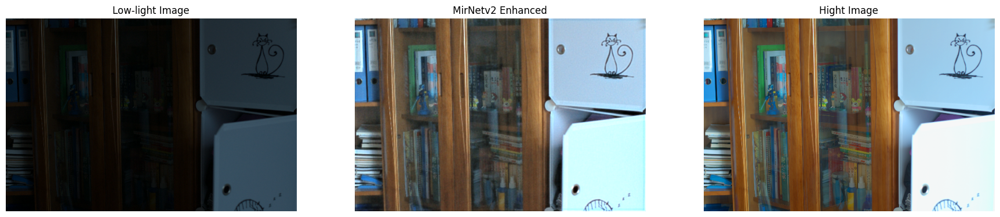

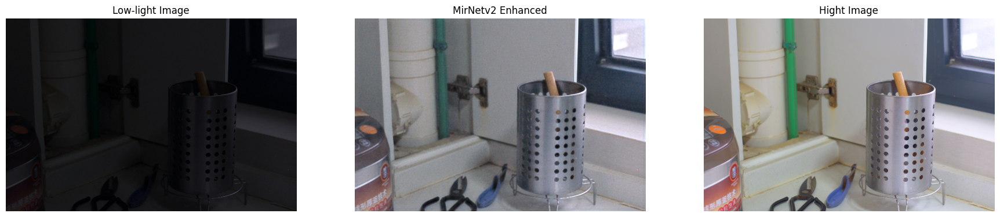

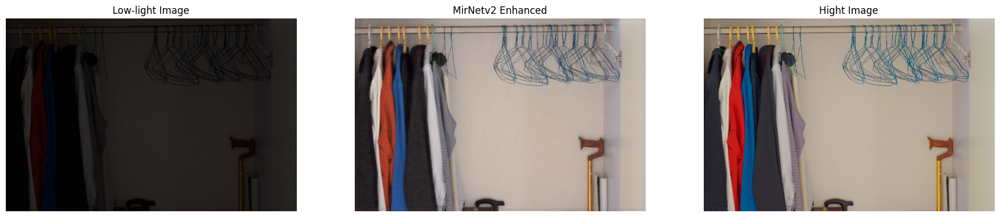

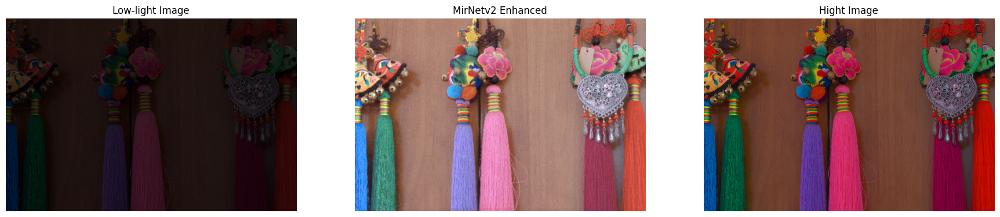

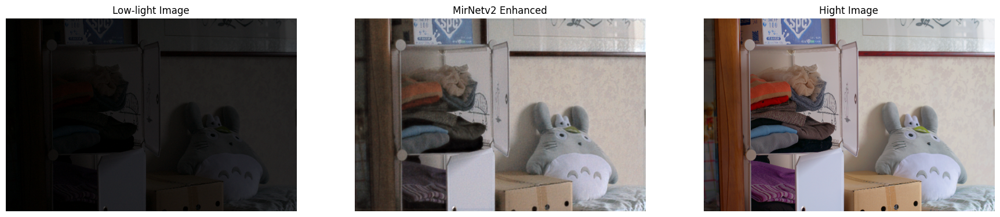

...

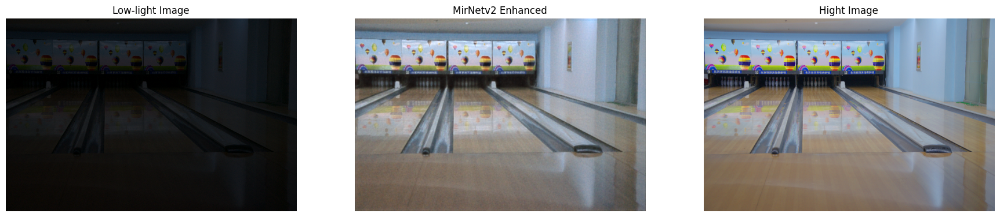

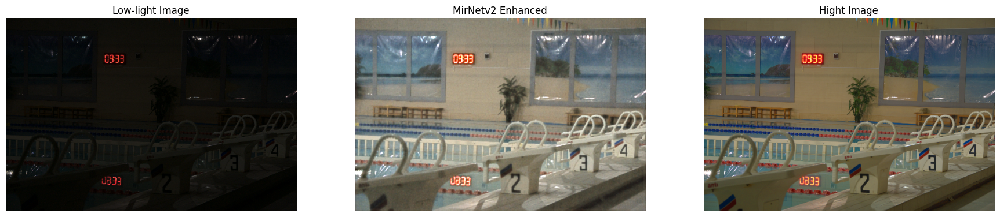

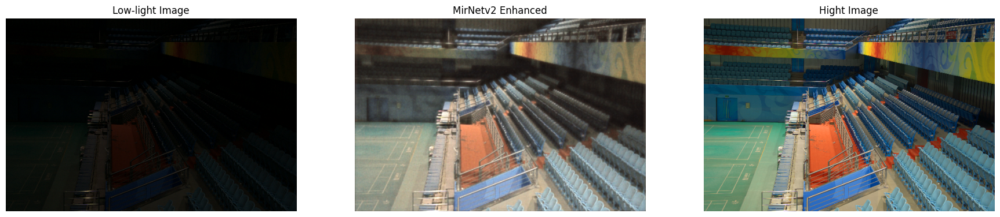

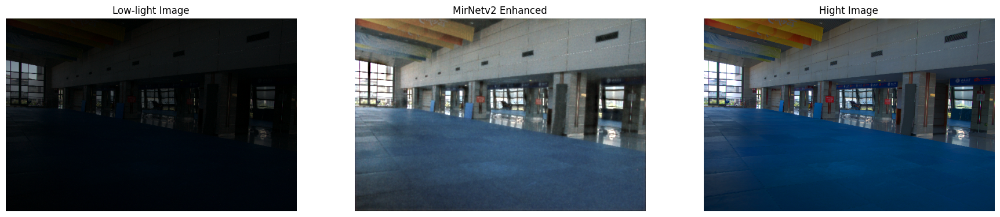

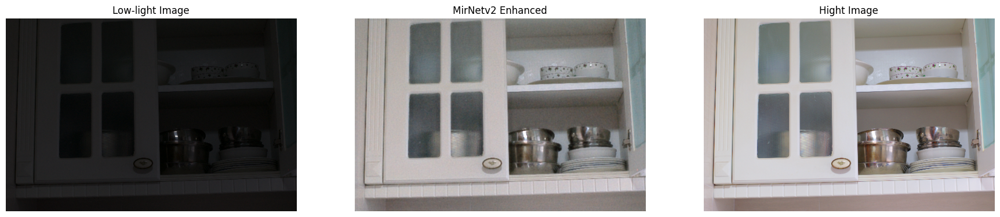

In [ ]:
def plot_results(images, titles, figure_size):
    num_images = len(images)

    plt.figure(figsize=figure_size)

    for i in range(num_images):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(images[i])
        plt.title(titles[i])
        plt.axis('off')

    plt.show()
for low_light_image_file, ground_truth_image_file in zip(TEST_LOW_LIGHT_IMAGES, TEST_GROUND_TRUTH_IMAGES):
    low_light_image = Image.open(low_light_image_file)
    preprocessed_image = preprocess_image(low_light_image)
    model_output = model.predict(preprocessed_image, verbose=0)
    post_processed_image = postprocess_image(model_output)

    # อ่านภาพจริงจาก TEST_GROUND_TRUTH_IMAGES
    ground_truth_image = Image.open(ground_truth_image_file)

    # พล็อตผลลัพธ์
    plot_results(
        images=[low_light_image, post_processed_image, ground_truth_image],
        titles=["Low-light Image", "MirNetv2 Enhanced", "Hight Image"],
        figure_size=(22, 15)
    )

In [ ]:
model.summary()

Model: "mir_netv2_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_238 (Conv2D)         multiple                  2240      
                                                                 
 recursive_residual_group_4  multiple                  2426936   
  (RecursiveResidualGroup)                                       
                                                                 
 recursive_residual_group_5  multiple                  1469336   
  (RecursiveResidualGroup)                                       
                                                                 
 recursive_residual_group_6  multiple                  990536    
  (RecursiveResidualGroup)                                       
                                                                 
 recursive_residual_group_7  multiple                  990536    
  (RecursiveResidualGroup)                             

#ลองนำภาพข้างนอกมาปรับปรุงผลลัพธ์ด้วยโมเดล

In [ ]:
new_low = "/content/drive/MyDrive/dataset444/L.jpg"
new_low2 = "/content/drive/MyDrive/dataset444/L2.jpg"

In [ ]:
new_image = Image.open(new_low)
new_image2 = Image.open(new_low2)
resized_new_image = new_image.resize((128, 128))
resized_new_image2 = new_image2.resize((128, 128))
# แปลงเป็น array และเพิ่มมิติ batch
new_image_array = np.expand_dims(np.array(resized_new_image), axis=0)
new_image_array2 = np.expand_dims(np.array(resized_new_image2), axis=0)
# แสดงขนาดของรูปที่ปรับขนาด
print("Resized New Image Shape:", new_image_array.shape)
print("Resized New Image Shape2:", new_image_array2.shape)

Resized New Image Shape: (1, 128, 128, 3)
Resized New Image Shape2: (1, 128, 128, 3)


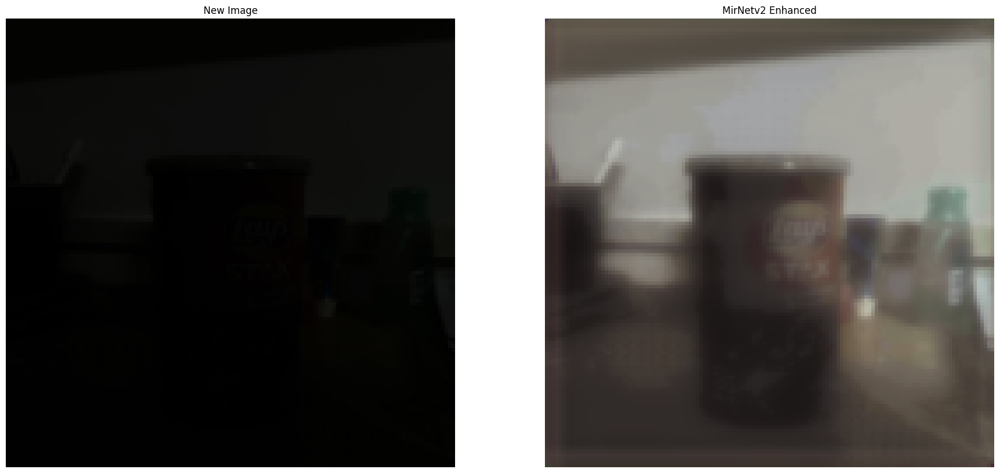

In [ ]:
resized_new_image = new_image.resize((128, 128))  # ปรับขนาดเป็น 128x128 พิกเซล
preprocessed_new_image = preprocess_image(resized_new_image)
model_output_new_image = model.predict(preprocessed_new_image, verbose=0)
post_processed_new_image = postprocess_image(model_output_new_image)

# พล็อตผลลัพธ์
plot_results(
    images=[resized_new_image, post_processed_new_image],
    titles=["New Image", "MirNetv2 Enhanced"],
    figure_size=(22, 15)
)

In [ ]:
run_id = "xa8sc2qx"

# รับข้อมูลการเข้าถึง Artifact จากรันที่ระบุ
run = wandb.init(id=run_id, project="mirnet-v2", entity="konthorn")
artifact = run.use_artifact("model:latest")

# ระบุไดเรกทอรีที่คุณต้องการดาวน์โหลดไฟล์ไป
download_dir = "downloaded_files"

# ดาวน์โหลดไฟล์จาก Artifact ไปยังไดเรกทอรีที่ระบุ
artifact.download(download_dir)

epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,███████▇▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
epoch/loss,█▆▆▅▅▄▄▃▃▃▃▃▃▃▃▂▃▂▂▃▃▂▂▂▂▂▂▁▂▁▂▂▁▁▁▁▁▁▁▁
epoch/psnr_metric_1,▁▂▃▃▃▅▅▆▅▆▅▆▆▆▆▆▆▆▇▆▆▇▇▇▇▇▇▇▇▇▇▇████████
epoch/ssim_metric_1,▁▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇█████
epoch/val_loss,█▁▁▃▂▃▄▄▃▂▄▂▃▂▄▄▂▃▃▃▁▄▂▂▃▂▁▂▂▁▁▁▁▁▁▁▂▂▂▂
epoch/val_psnr_metric_1,▁▆▆▅▆▅▅▅▅▆▅▆▆▆▅▅▇▆▆▆▇▅▆▇▆▇█▇████▇▇▇█▇▇▇▇
epoch/val_ssim_metric_1,▁▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇█▇▇▇▇▇██▇███████████████
epoch/epoch,99
epoch/learning_rate,0.0
epoch/loss,0.09807


wandb:   5 of 5 files downloaded.  


'downloaded_files'